# CS 497 Final Project: Toast Bot
Daniele Moro and Oghenemaro Anuyah

## Import relevant packages

In [35]:
import pandas as pd
import numpy as np
import pandas as pd
import glob
import string
from string import digits
import matplotlib.pyplot as plt
%matplotlib inline
import re
import seaborn as sns
import sklearn
from nltk.corpus import stopwords
import collections as c

import nltk
import matplotlib.pyplot as plt
from collections import Counter
import nltk
from nltk.translate.bleu_score import corpus_bleu
import os
from keras.applications.vgg19 import VGG19
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input
from keras.layers import Input, LSTM, Embedding, Dense
from keras.models import Model
from keras.utils import plot_model
from keras.layers.merge import concatenate
import IPython
from tqdm import tqdm_notebook as tqdm
import requests
stops = stop_words = set(stopwords.words('english')) 
try:
    from sklearn.model_selection import train_test_split
except ModuleNotFoundError:
    from sklearn.cross_validation import train_test_split

In [2]:
# the vgg 19 model is used for getting the image features
vgg19_model = VGG19(weights='imagenet')
vgg19_model = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer('predictions').output)

# Utility Functions
Many of these functions were inspired from the following tutorial: 
https://medium.com/@dev.elect.iitd/neural-machine-translation-using-word-level-seq2seq-model-47538cba8cd7

In [3]:
def process_data(filename = "./data_with_image_features.json", top_comments=10, max_sent=3, max_words=60):
    reddit_data = pd.read_json(filename)
    
    #grab top comments
    reddit_data.comments = [x[:top_comments] for x in reddit_data.comments]

    # expand the data so that each comment has its own row
    lst_col_ga = 'comments'
    df = reddit_data
    reddit_data = pd.DataFrame({
         col:np.repeat(df[col].values, df[lst_col_ga].str.len())
         for col in df.columns.drop(lst_col_ga)}
       ).assign(**{lst_col_ga:np.concatenate(df[lst_col_ga].values)})[df.columns].dropna().reset_index(drop = True)
    
    
    
    # select relevant columns
    reddit_data = reddit_data[["title", "comments", "image_feature", "url"]]
    
    # clean whitespace
    reddit_data.comments = [x.replace("\n", ' ').replace("\t", ' ') for x in reddit_data.comments]
    reddit_data.title = [x.replace("\n", ' ').replace("\t", ' ') for x in reddit_data.title]
    
    # lower the words
    reddit_data.title = reddit_data.title.apply(lambda x: x.lower())
    reddit_data.comments = reddit_data.comments.apply(lambda x: x.lower())
    
    # get only the top sentences
    reddit_data.title = [". ".join(nltk.sent_tokenize(x)[:max_sent]) for x in reddit_data.title]
    reddit_data.comments = [". ".join(nltk.sent_tokenize(x)[:max_sent]) for x in reddit_data.comments]
    # if the sentence is too long, cut it off
    reddit_data.comments = [" ".join((nltk.word_tokenize(x))[:max_words]) for x in reddit_data.comments]
                 
    # remove punctuation
    reddit_data.title = reddit_data.title.apply(lambda x: ''.join(ch for ch in x if ch not in set(string.punctuation)))
    reddit_data.comments = reddit_data.comments.apply(lambda x: ''.join(ch for ch in x if ch not in set(string.punctuation)))
    
    # remove numbers
    remove_numbers = str.maketrans('', '', digits)
    reddit_data.title = reddit_data.title.apply(lambda x: x.translate(remove_numbers))
    reddit_data.comments = reddit_data.comments.apply(lambda x: x.translate(remove_numbers))
                 
    # add start and end tokens
    reddit_data.comments = reddit_data.comments.apply(lambda x : 'START_ '+ x + ' _END')
    
    return reddit_data

def build_tokenizers(reddit, vocab_size=1000):
    # build a vocabulary
    title_vocab = [nltk.word_tokenize(x) for x in reddit.title]
    title_vocab = [i for k in title_vocab for i in k]
    title_vocab = [x[0] for x in Counter(title_vocab).most_common()[:vocab_size]]
    comments_vocab = [nltk.word_tokenize(x) for x in reddit.comments]
    comments_vocab = [i for k in comments_vocab for i in k]
    comments_vocab = [x[0] for x in Counter(comments_vocab).most_common()[:vocab_size]]
    
    # tokenize
    input_words = sorted(list(title_vocab))
    target_words = sorted(list(comments_vocab))
    input_tokenizer = {word: i for i, word in enumerate(input_words)}
    target_tokenizer = {word: i for i, word in enumerate(target_words)}
    
    return input_tokenizer, target_tokenizer    

def get_glove_embeddings(glove_dir):
    embeddings_index = {}
    with open(os.path.join(glove_dir, 'glove.6B.300d.txt'), encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
    print('Found {} word vectors'.format(len(embeddings_index)))
    return embeddings_index

def build_embedding_matrix(tokenizer, embeddings, embedding_dim = 300):
    embedding_matrix = np.zeros((len(tokenizer), embedding_dim))
    for word, i in [i for i in tokenizer.items()]:
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector
    return embedding_matrix

def get_input_target_data(reddit, input_tokenizer, target_tokenizer):
    max_comment_length = np.max([len(l.split(' ')) for l in reddit.comments])
    max_title_length = np.max([len(l.split(' ')) for l in reddit.title])
    
    encoder_input_data = np.zeros((len(reddit.title), max_title_length), dtype='float32')
    decoder_input_data = np.zeros((len(reddit.comments), max_comment_length), dtype='float32')
    decoder_target_data = np.zeros((len(reddit.comments), max_comment_length, len(target_tokenizer)),dtype='float32')
    
    for i, (input_text, target_text) in enumerate(zip(reddit.title, reddit.comments)):
        for t, word in enumerate(input_text.split()):
            if word in input_tokenizer:
                encoder_input_data[i, t] = input_tokenizer[word]
        for t, word in enumerate(target_text.split()):
            if word in target_tokenizer: 
                decoder_input_data[i, t] = target_tokenizer[word]
                if t > 0:
                    # decoder_target_data will be ahead by one timestep
                    decoder_target_data[i, t - 1, target_tokenizer[word]] = 1.
    return encoder_input_data, decoder_input_data, decoder_target_data

def get_image_features(reddit):
    max_comment_length = np.max([len(l.split(' ')) for l in reddit.comments])
    image_features = np.array([np.array(i) for i in reddit.image_feature]).reshape(-1, 1, 1000)
    image_features = np.broadcast_to(image_features, (image_features.shape[0], max_comment_length,image_features.shape[2]))
    return image_features
    
def define_model(input_tokenizer, target_tokenizer, embedding_matrix_input, embedding_matrix_target):
    # define the encoder
    embedding_dim_input = embedding_matrix_input.shape[1] 
    encoder_inputs = Input(shape=(None,))
    en_x =  Embedding(len(input_tokenizer), embedding_dim_input, weights=[embedding_matrix_input], trainable = False)(encoder_inputs)
    encoder = LSTM(50, return_state=True)
    encoder_outputs, state_h, state_c = encoder(en_x) #discard output and keep states
    encoder_states = [state_h, state_c]
    
    # define the decoder
    embedding_dim_output = embedding_matrix_input.shape[1] 
    num_decoder_tokens = len(target_tokenizer)
    decoder_inputs = Input(shape=(None,))
    dex =  Embedding(num_decoder_tokens, embedding_dim_output, weights=[embedding_matrix_target], trainable = False)
    final_dex = dex(decoder_inputs)

    input_image = Input(shape=(None, 1000))
    y = input_image
    y = Model(inputs=input_image, outputs=y)

    combined = concatenate([final_dex, y.output])

    decoder_lstm = LSTM(50, return_sequences=True, return_state=True)
    decoder_outputs, _, _ = decoder_lstm(combined, initial_state=encoder_states)
    decoder_dense = Dense(num_decoder_tokens, activation='softmax')
    decoder_outputs = decoder_dense(decoder_outputs)

    model = Model([encoder_inputs, y.input, decoder_inputs], decoder_outputs)
    model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['acc'])

    # compile the encoder and decoder models for prediction
    encoder_model = Model(encoder_inputs, encoder_states)
    encoder_model.summary()
    decoder_state_input_h = Input(shape=(50,))
    decoder_state_input_c = Input(shape=(50,))
    decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]

    final_dex2= dex(decoder_inputs)
    input_image2 = Input(shape=(None, 1000))
    y2 = input_image2
    y2 = Model(inputs=input_image2, outputs=y2)
    combined = concatenate([final_dex2, y.output])

    decoder_outputs2, state_h2, state_c2 = decoder_lstm(combined, initial_state=decoder_states_inputs)
    decoder_states2 = [state_h2, state_c2]
    decoder_outputs2 = decoder_dense(decoder_outputs2)
    decoder_model = Model(
        [decoder_inputs, y.input] + decoder_states_inputs,
        [decoder_outputs2] + decoder_states2)
    
    return model, encoder_model, decoder_model

def decode_sequence(input_seq, input_img, encoder_model, decoder_model, input_tokenizer, target_tokenizer):
    reverse_input_char_index = dict( (i, char) for char, i in input_tokenizer.items())
    reverse_target_char_index = dict((i, char) for char, i in target_tokenizer.items())
    # Encode the input as state vectors.
    states_value = encoder_model.predict(input_seq)
    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1,1))
    # Populate the first character of target sequence with the start character.
    target_seq[0, 0] = target_tokenizer['START_']

    # Sampling loop for a batch of sequences
    # (to simplify, here we assume a batch of size 1).
    stop_condition = False
    decoded_sentence = []
    while not stop_condition:
        output_tokens, h, c = decoder_model.predict(
            [target_seq, input_img] + states_value)

        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_char = reverse_target_char_index[sampled_token_index]
        decoded_sentence.append(sampled_char)

        # Exit condition: either hit max length
        # or find stop character.
        if (sampled_char == '_END' or
           len(decoded_sentence) > 100):
            stop_condition = True

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1, 1))
        target_seq[0, 0] = sampled_token_index

        # Update states
        states_value = [h, c]
        
    return decoded_sentence



# Get Data

In [5]:
data_path = "./data_with_image_features.json"
reddit = process_data(filename = data_path, top_comments=10, max_sent=3, max_words=60)

# Exploratory Analysis

In [16]:
reddit[0:10]

,title,comments,image_feature,url
0,i wanted to share a big milestone for me when ...,START_ i don ’ t even know what to say rtoast...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
1,i wanted to share a big milestone for me when ...,START_ happy birthday i love your smile 💕 _END,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
2,i wanted to share a big milestone for me when ...,START_ happy birthday congratulations on mak...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
3,i wanted to share a big milestone for me when ...,START_ it makes me happy to see you smile aft...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
4,i wanted to share a big milestone for me when ...,START_ happy birthday i ’ m so glad that you...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
5,i wanted to share a big milestone for me when ...,START_ happy birthday i ’ m so glad you coul...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
6,i wanted to share a big milestone for me when ...,START_ happy birthday and congratulations for ...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
7,i wanted to share a big milestone for me when ...,START_ hooray and many happy returns on a mile...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
8,i wanted to share a big milestone for me when ...,START_ that s awesome to hear i m glad you...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg
9,i wanted to share a big milestone for me when ...,START_ happy birthday your smile is super c...,"[8.63e-07, 1.7713e-06, 2.3954e-06, 6.317700000...",https://i.redd.it/y2u2a7gxuuj21.jpg


## Find the most common words

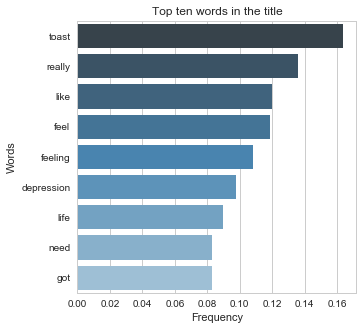

In [17]:
titles_all_words = [nltk.word_tokenize(x) for x in reddit.title]
titles_all_words = [x for i in titles_all_words for x in i]
titles_all_words = [x for x in titles_all_words if x not in stops]
titles_all_words_freq = c.Counter(titles_all_words).most_common(13)
titles_all_words_freq.pop(0)
titles_all_words_freq.pop(0)
titles_all_words_freq.pop(0)
titles_all_words_freq.pop(1)

titles_all_words_freq_df = pd.DataFrame(columns=["words", "counts"], data = titles_all_words_freq)
titles_all_words_freq_df["freq"] = titles_all_words_freq_df.counts / sum(titles_all_words_freq_df.counts)

sns.set(rc={'figure.figsize': (5, 5)})
sns.set(style="whitegrid")

ax = sns.barplot(x = 'freq', y = 'words', data = titles_all_words_freq_df, palette="Blues_d")
ax.set_xlabel('Frequency')
ax.set_xlabel('Frequency')
ax.set_ylabel('Words')
plt.title("Top ten words in the title")
plt.show()

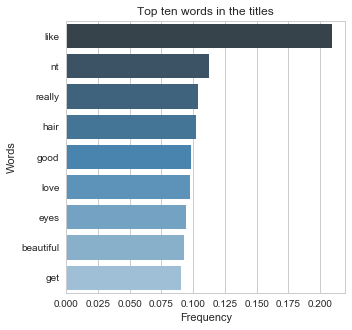

In [18]:
comments_all_words = [nltk.word_tokenize(x) for x in reddit.comments]
comments_all_words = [x for i in comments_all_words for x in i]
comments_all_words = [x for x in comments_all_words if x not in stops]
comments_all_words_freq = c.Counter(comments_all_words).most_common(13)
comments_all_words_freq.pop(0)
comments_all_words_freq.pop(0)
comments_all_words_freq.pop(0)
comments_all_words_freq.pop(1)

comments_all_words_freq_df = pd.DataFrame(columns=["words", "counts"], data = comments_all_words_freq)
comments_all_words_freq_df["freq"] = comments_all_words_freq_df.counts / sum(comments_all_words_freq_df.counts)
sns.set(rc={'figure.figsize': (5, 5)})
sns.set(style="whitegrid")

ax = sns.barplot(x = 'freq', y = 'words', data = comments_all_words_freq_df, palette="Blues_d")
ax.set_xlabel('Frequency')
ax.set_xlabel('Frequency')
ax.set_ylabel('Words')
plt.title("Top ten words in the titles")
plt.show()

## Find the distribution of length

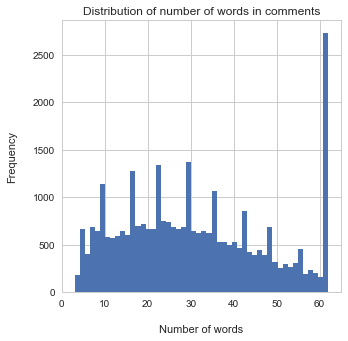

In [19]:
lenght_list = []
for l in reddit.comments:
    lenght_list.append(len(l.split(' ')))
np.mean(lenght_list), np.max(lenght_list)
plt.hist(lenght_list, bins = 50)
plt.ylabel("Frequency\n")
plt.xlabel("\nNumber of words")
plt.title("Distribution of number of words in comments")
plt.show()

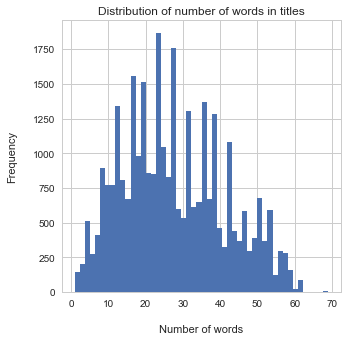

In [20]:
lenght_list = []
for l in reddit.title:
    lenght_list.append(len(l.split(' ')))
np.mean(lenght_list), np.max(lenght_list)
plt.hist(lenght_list, bins = 50)
plt.ylabel("Frequency\n")
plt.xlabel("\nNumber of words")
plt.title("Distribution of number of words in titles")
plt.show()

# Pre-processing

In [6]:
# build tokenizers and glove embeddings
glove_root = "./"
input_tokenizer, target_tokenizer = build_tokenizers(reddit)
embeddings = get_glove_embeddings(glove_root)

# get embedding matrices
input_embedding_matrix = build_embedding_matrix(input_tokenizer, embeddings)
output_embedding_matrix = build_embedding_matrix(input_tokenizer, embeddings)

#split the data
reddit_train, reddit_test = train_test_split(reddit, test_size=0.1, random_state=42)
reddit_train = pd.DataFrame(reddit_train, columns = reddit.columns).reset_index(drop = True)
reddit_test = pd.DataFrame(reddit_test, columns = reddit.columns).reset_index(drop = True)

# get the raw data
encoder_input_data_tr, decoder_input_data_tr, decoder_target_data_tr = get_input_target_data(reddit_train,
                                                                                             input_tokenizer, 
                                                                                             target_tokenizer)
encoder_input_data_te, decoder_input_data_te, decoder_target_data_te = get_input_target_data(reddit_test, 
                                                                                             input_tokenizer, 
                                                                                             target_tokenizer)
image_features_tr = get_image_features(reddit_train)
image_features_te = get_image_features(reddit_test)


# define the model
model, encoder_model, decoder_model = define_model(input_tokenizer, target_tokenizer, 
                                                    input_embedding_matrix, output_embedding_matrix)
display(model.summary())

Found 400000 word vectors
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None)              0         
_________________________________________________________________
embedding_1 (Embedding)      (None, None, 300)         300000    
_________________________________________________________________
lstm_1 (LSTM)                [(None, 50), (None, 50),  70200     
Total params: 370,200
Trainable params: 70,200
Non-trainable params: 300,000
_________________________________________________________________
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None)         0                                            
________________________________________________________________________

None

# Training

In [ ]:
# train
model_name = "newmodel.h5"
model.fit([encoder_input_data_tr, image_features_tr, decoder_input_data_tr], decoder_target_data_tr,
        validation_data=([encoder_input_data_te, image_features_te, decoder_input_data_te], decoder_target_data_te),
          batch_size = 64,
          epochs = 100)
model.save_weights(model_name)
print("Saved model {} to disk".format(model_name))

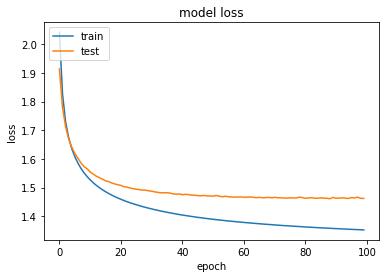

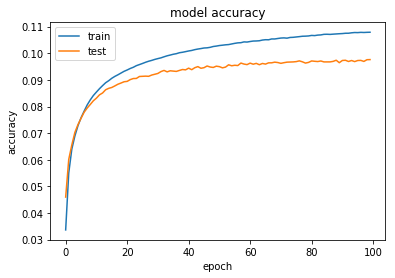

In [13]:
# source: https://keras.io/visualization/
history = model.history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Evaluation 

In [38]:
def evaluate_model(raw_dataset, decoder_input_data, encoder_input_data, start=0, end=None, print_examples=False):
    if end is None:
        end = len(encoder_input_data)
    
    inv_target_tokenizer = {v: k for k, v in target_tokenizer.items()}
    inv_input_tokenizer = {v: k for k, v in input_tokenizer.items()}
    actual, predicted = list(), list()

    for seq_index in tqdm(range(start, end)):  
        act = [inv_target_tokenizer[i] for i in decoder_input_data_te[seq_index] if inv_target_tokenizer[i] != "START_"]
        actual.append(act)
        
        input_seq = encoder_input_data[seq_index: seq_index + 1]
        input_img = np.array(reddit.image_feature[seq_index]).reshape(1,1,1000)
        pred = decode_sequence(input_seq, input_img, encoder_model, decoder_model, input_tokenizer, target_tokenizer)
        predicted.append(pred)
        
        url = raw_dataset.url[seq_index]
        if print_examples and exists_image_url(url):
            #print("seq_index: [{}]".format(seq_index))
            display(IPython.display.Image(url, width = 250))
            title_text = [inv_input_tokenizer[i] for i in encoder_input_data_te[seq_index] if i != 0]
            print("INPUT:\n{}\n".format(" ".join(title_text)))
            print("PREDICTED:\n{}\n".format(" ".join(pred)))
            print("TARGET (real comment):\n{}".format(" ".join(act)))
            print("----------")
            
    return corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))

def exists_image_url(path):
    return requests.head(path).status_code == requests.codes.ok

def get_one_img(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    prediction_features = vgg19_model.predict(x)
    return prediction_features.ravel()

def user_input(input_words, img_feats, seq_len):
    input_seq = np.array([input_tokenizer[w] if w in input_tokenizer else 0 for w in input_words.split()] + 
                         [0] * (seq_len - len(input_words.split()))).reshape(1, seq_len)
    input_img = np.array(img_feats.reshape(1,1,1000))
    inv_input_token_index = {v: k for k, v in input_tokenizer.items()}
    #print("raw input: [{}] {}".format(" ".join([inv_input_token_index[i] for i in input_seq[0]]), input_seq.shape))
    decoded_sentence = decode_sequence(input_seq, input_img, encoder_model, decoder_model, input_tokenizer, target_tokenizer)
    return " ".join(decoded_sentence).replace("START_ ", "").replace(" _END","")

In [7]:
model.load_weights("model.h5")

In [10]:
evaluate_model(reddit_test, encoder_input_data_te, decoder_input_data_te, print_examples=False)

C:\Users\morod\Anaconda3\lib\site-packages\nltk\translate\bleu_score.py:503: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
C:\Users\morod\Anaconda3\lib\site-packages\nltk\translate\bleu_score.py:503: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


0.08841616980402722

# Examples

In [39]:
text = "Today is my birthday"
img = get_one_img("../images/1.jpg")
user_input(text, img, encoder_input_data_tr.shape[1])

'happy birthday'

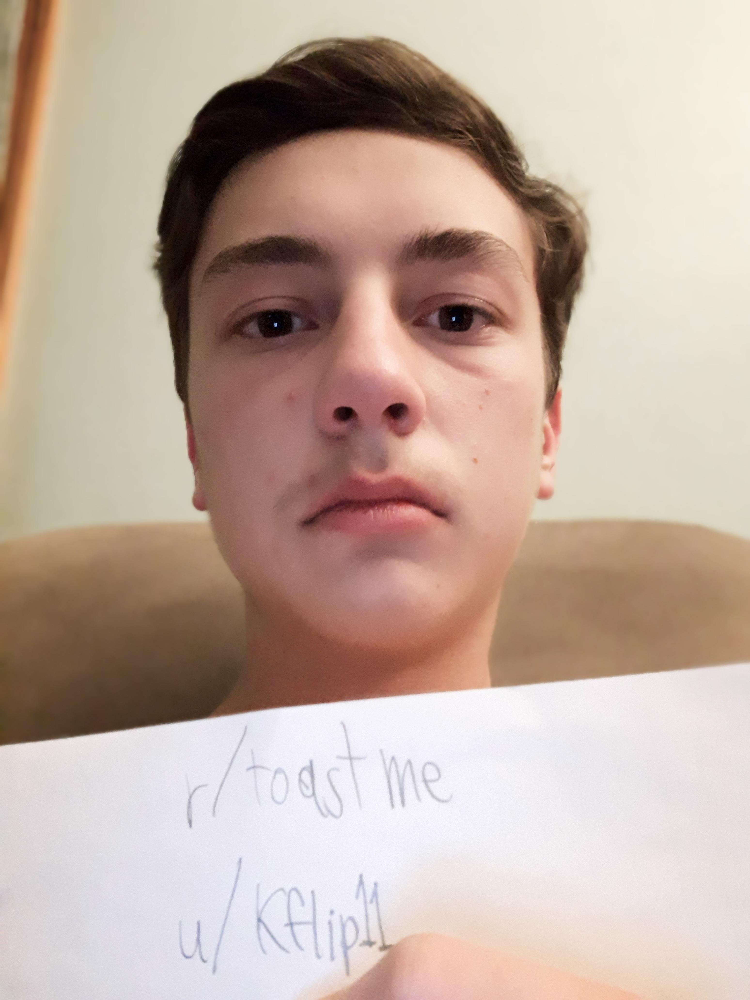

INPUT:
im high school who feels that im ugly and unattractive so thoughts

PREDICTED:
everybody needs all the truth to hear that you are a beautiful person who is a good looking guy i m sure you re a strong person and you have a great smile _END

TARGET (real comment):
your hair s looking awesome xb everyone in goes through those thoughts dont stress it my man _END
----------


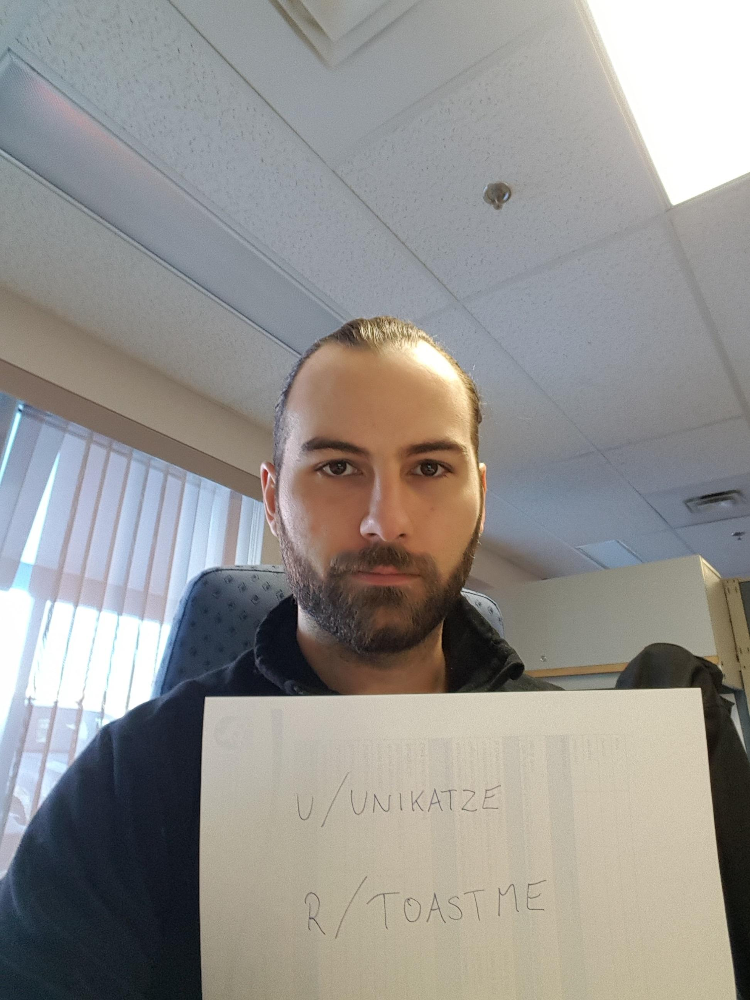

INPUT:
need pickmeup

PREDICTED:
do nt let anyone tell you otherwise you are not alone and you re doing great _END

TARGET (real comment):
dude listen i ca nt think now because your eyes are deep brown simply just wow man from that i hope life is you well _END
----------


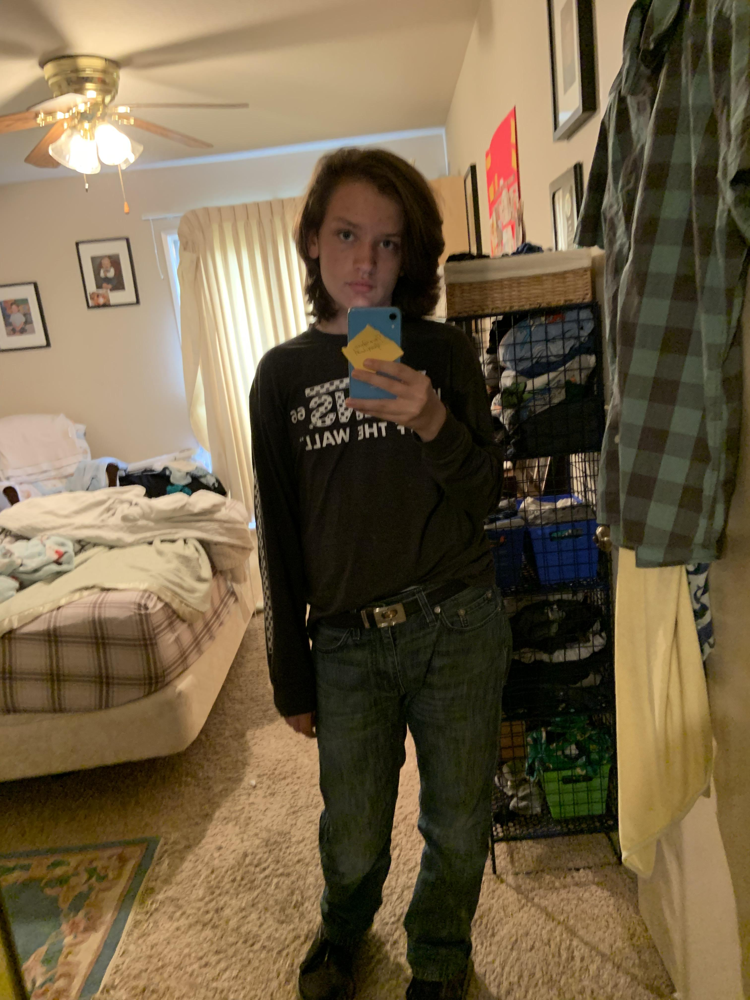

INPUT:
been lot about my appearance had some people think which is okay but i help but what other people think about me better verification in the comments the pic

PREDICTED:
you ’ re a very strong person and you ’ re doing great _END

TARGET (real comment):
it does nt matter what else because when you care what others think you let them control you _END
----------


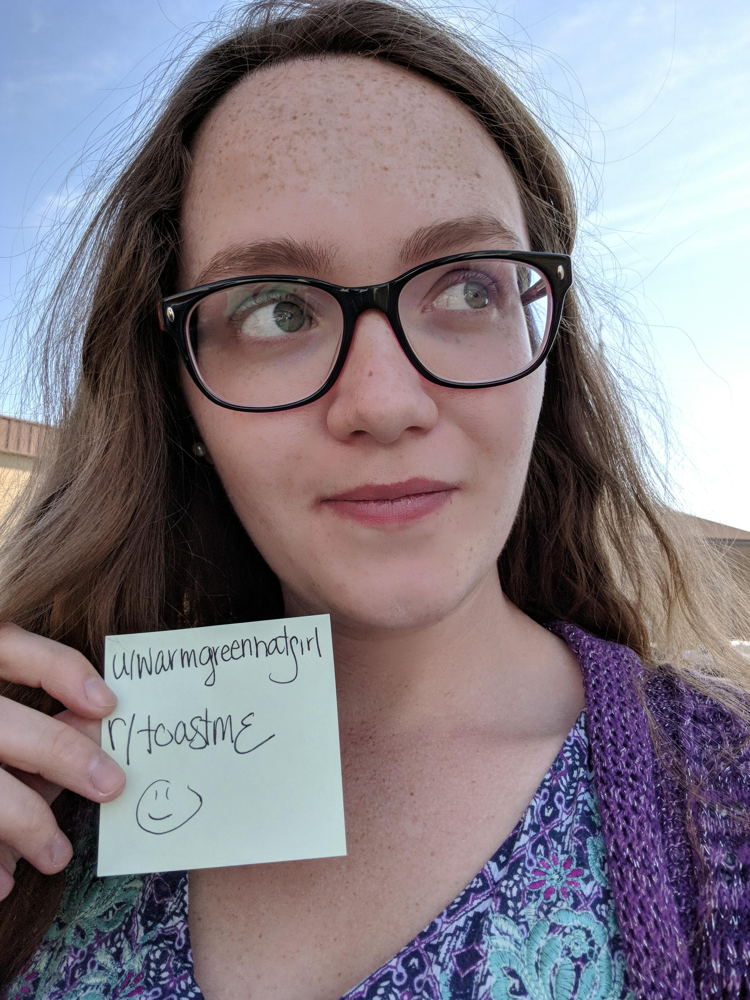

INPUT:
could really use little positivity in my life right now my are hard life is hard

PREDICTED:
you are so strong and you have a lot of courage to be able to be able to earth people in your life is nt always a little time to do it _END

TARGET (real comment):
you are very adorable and beautiful and those eyes oh my word 😍 _END
----------


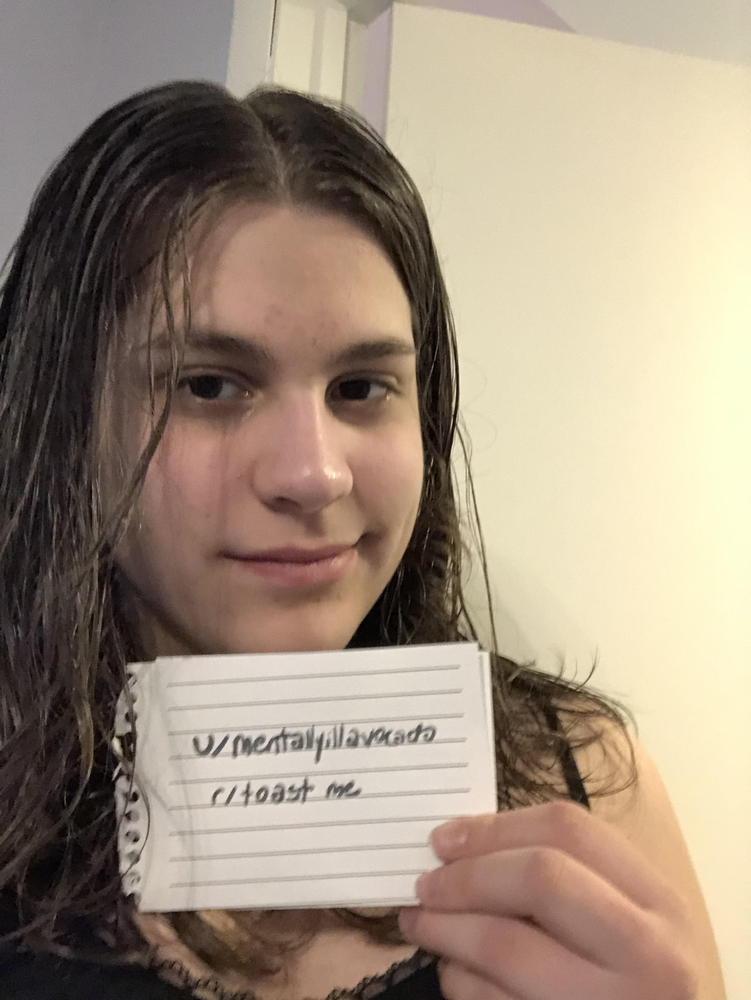

INPUT:
spent the last months in and out of and day for suicidal thoughts depression anxiety ed and bpd starting to get better but having rough day suicidal and ed thoughts are starting to in and i could use boost

PREDICTED:
i ’ m sorry you ’ re feeling lonely and i ’ m sorry you ’ re going through a rough time but get through this and i ’ m sure you ’ ll be there you ’ re a great person _END

TARGET (real comment):
by your username and cute smile you seem like a really funny person if you re feeling down maybe watch a funny show or really any show you enjoy remember your worth is and you deserve all the happiness in the world _END
----------


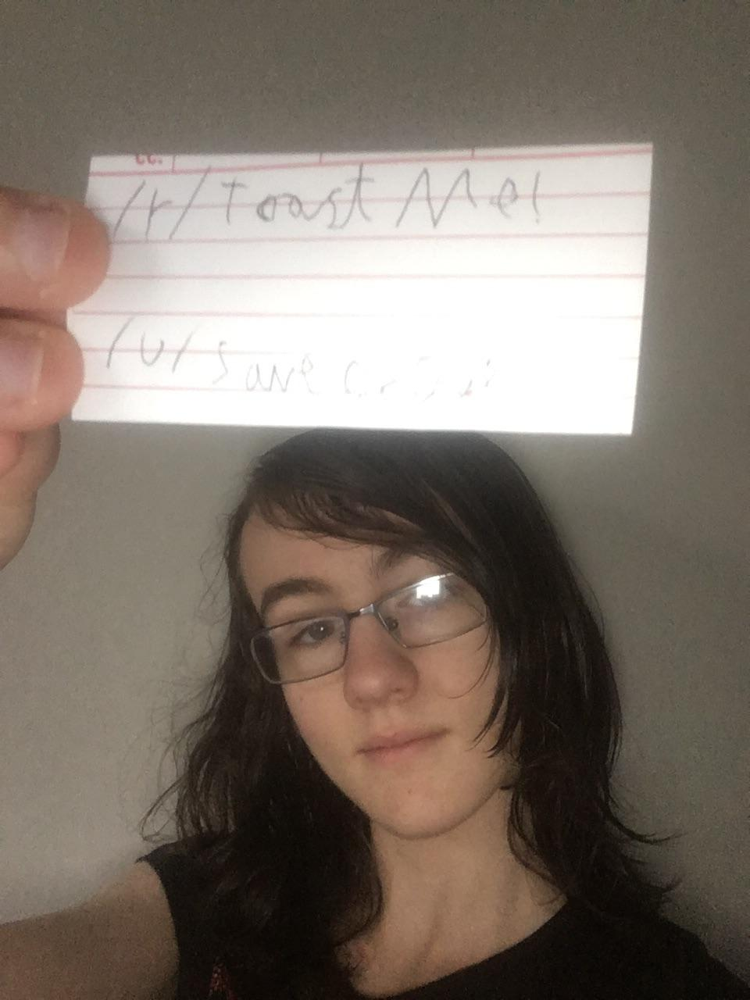

INPUT:
f been hitting me pretty hard this week little boost would be lovely

PREDICTED:
happy birthday i ’ m sorry you ’ re going through a rough time but know you are so strong and you ’ re still here and you ’ re not alone in the world you ’ re going to be a good person _END

TARGET (real comment):
you are beautiful and pass super well from a trans man to a trans woman you re gorgeous and you are loved _END
----------


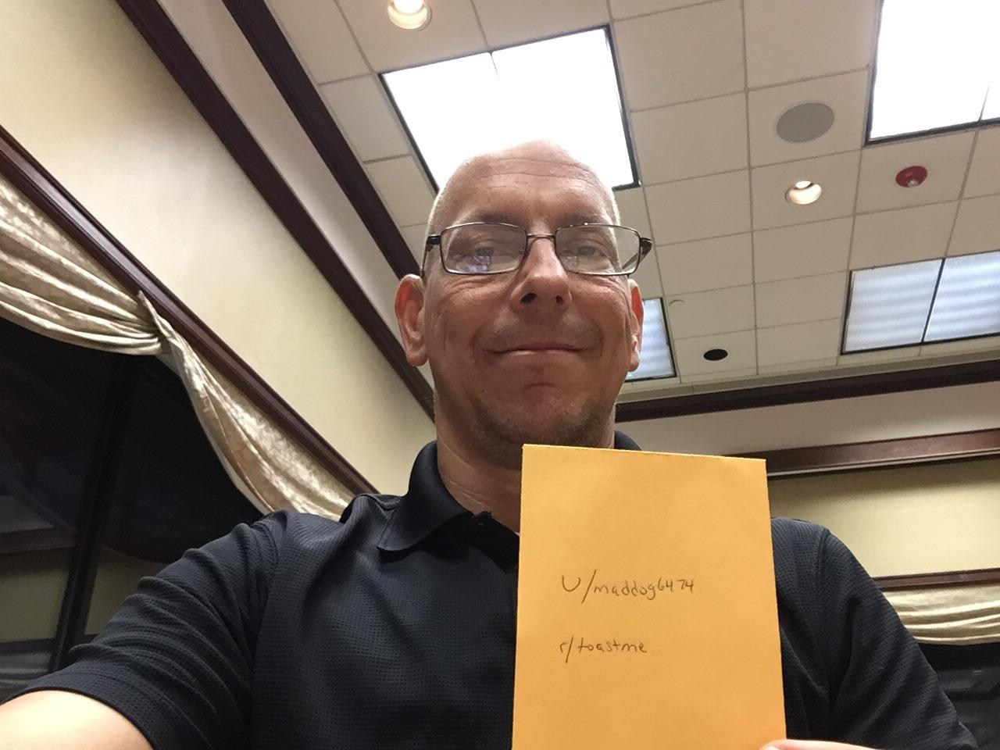

INPUT:
this is toast to you yes you you who are struggling with how you look how you feel or those telling you not good enough

PREDICTED:
well i ’ m pushing there i was a lot of idea to do my hair _END

TARGET (real comment):
thank you so much _END
----------


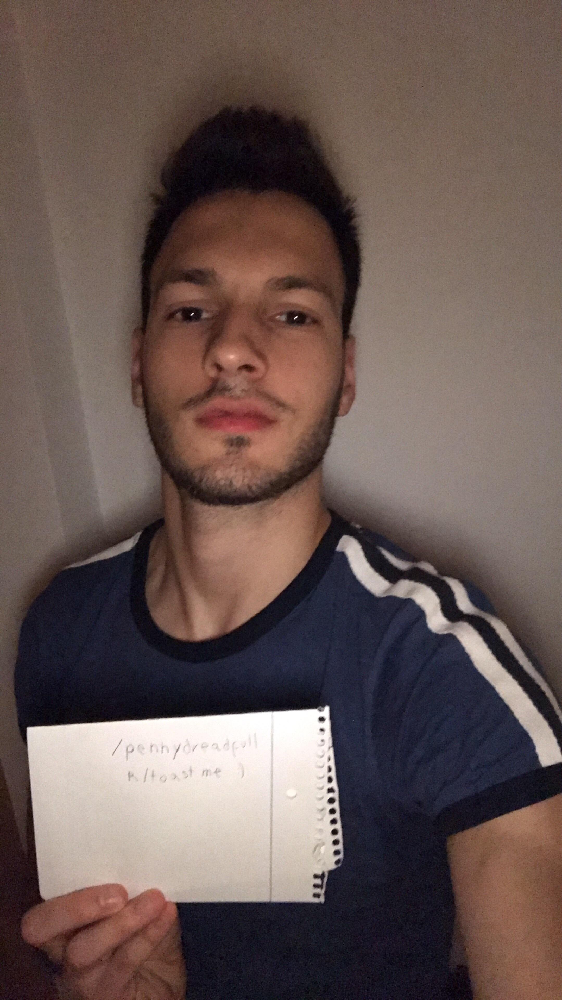

INPUT:
m years and still fighting back my and mental health issues i wish i could give you all huge hug because the comments on this subreddit make me want to cry out of happiness because you guys give me some hope in

PREDICTED:
i ’ m sure there is a lot of people who can ’ t be scared to be friends with you _END

TARGET (real comment):
i ’ ve with from and and i ’ m so proud that you ’ ve taken the steps to love yourself and see your worth it ’ s a struggle but here you are despite that you are so and strong i can sense it _END
----------


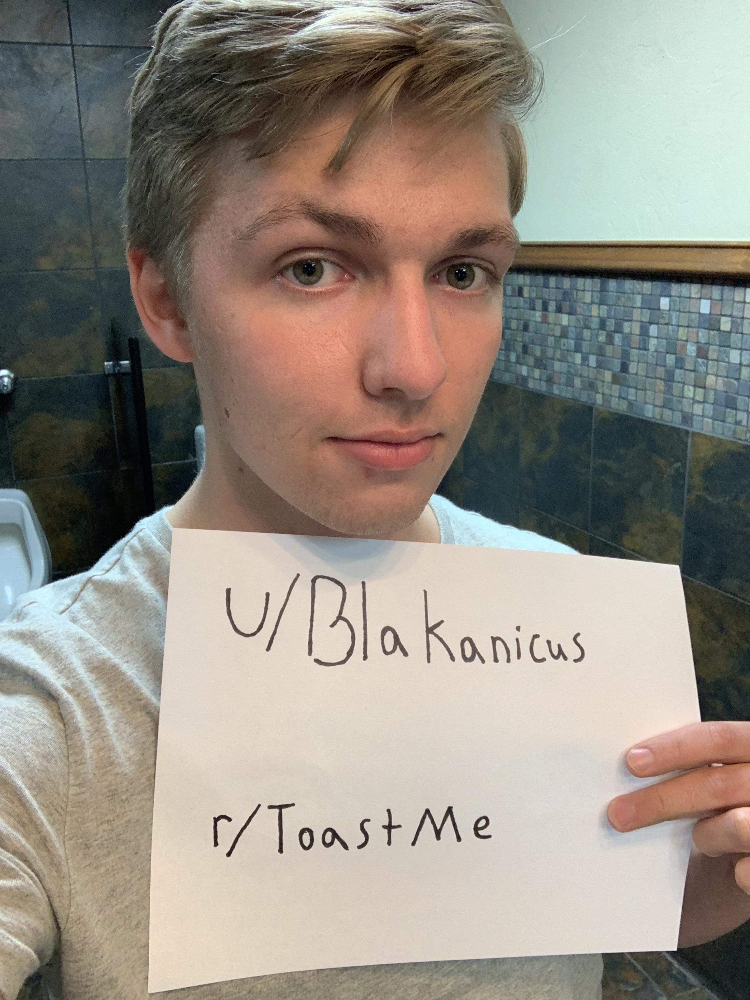

INPUT:
and at work again first i got roasted and now time to get toasted

PREDICTED:
you are a strong person i m sure you re going to be a good person _END

TARGET (real comment):
and remember with great comes great with that you ’ ll go places _END
----------


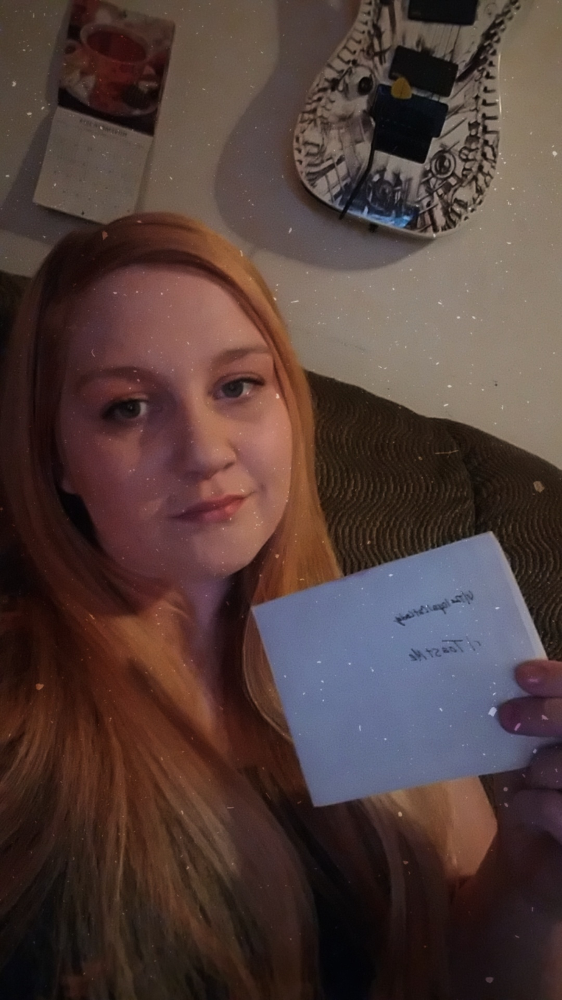

INPUT:
been dealing with addiction for most of my life this week i am weeks after treatment i still keep this from most of my family but for me this is the beginning of whole new life

PREDICTED:
you ’ re a beautiful woman who ’ s not many people who are you are you are strong and you ’ re not done _END

TARGET (real comment):
as the child of a you for having the strength my father ’ s many lives although he was a “ of the “ i for years at his _END
----------


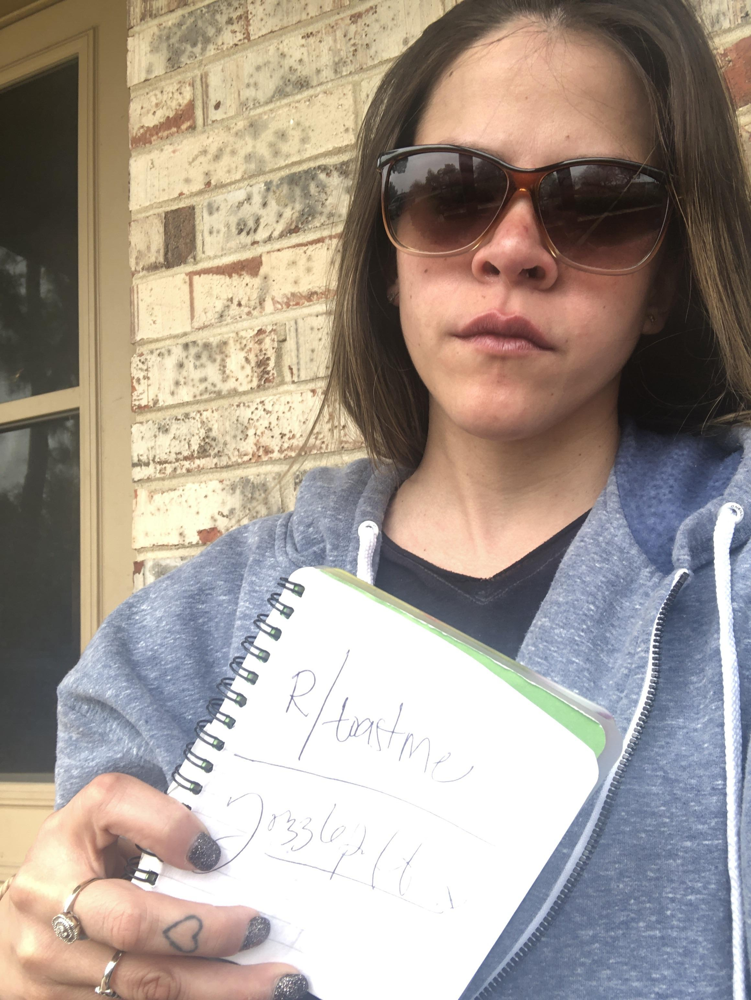

INPUT:
my boyfriend is leaving me my just passed away i am unemployed and living at home everyone my when in reality it is crippling depression

PREDICTED:
i m sure you re going through a lot of people who are nt a lot of people who are nt really comfortable you are a lot of people who are nt really comfortable _END

TARGET (real comment):
i come from a family of people who with if it was easy to stop then they would just stop all the best to you just know you aren ’ t alone and there are people who understand both depression and _END
----------


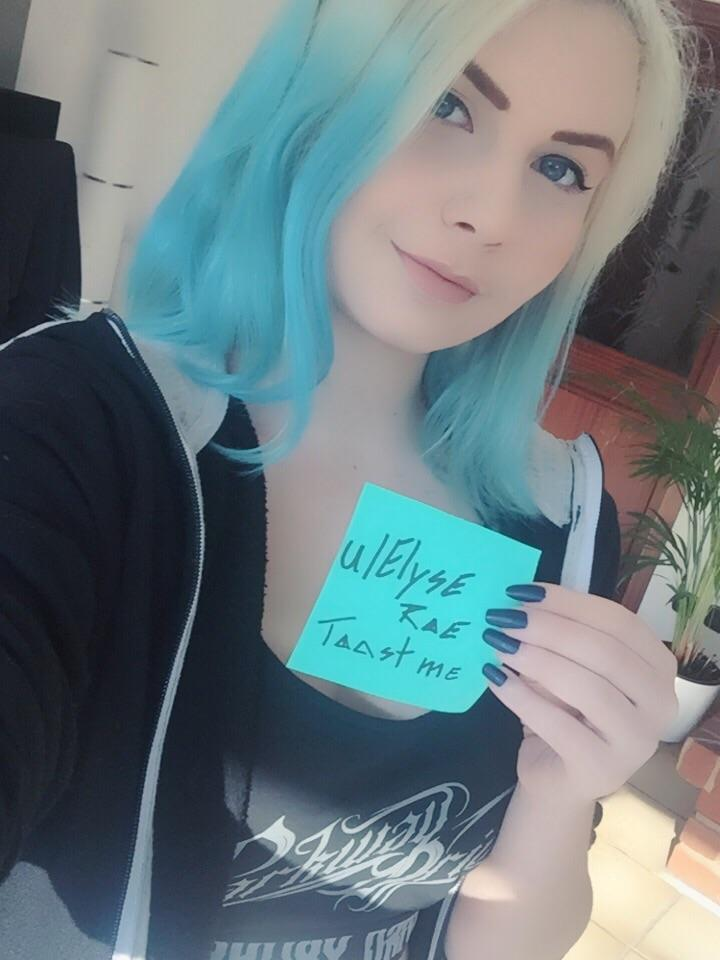

INPUT:
been struggling with both my getting better and body image lately could use little love in me life

PREDICTED:
you have a nice smile and i love your eyes _END

TARGET (real comment):
i love all the blue blue hair blue eyes blue note blue nails damn you are absolutely the blue look girl _END
----------


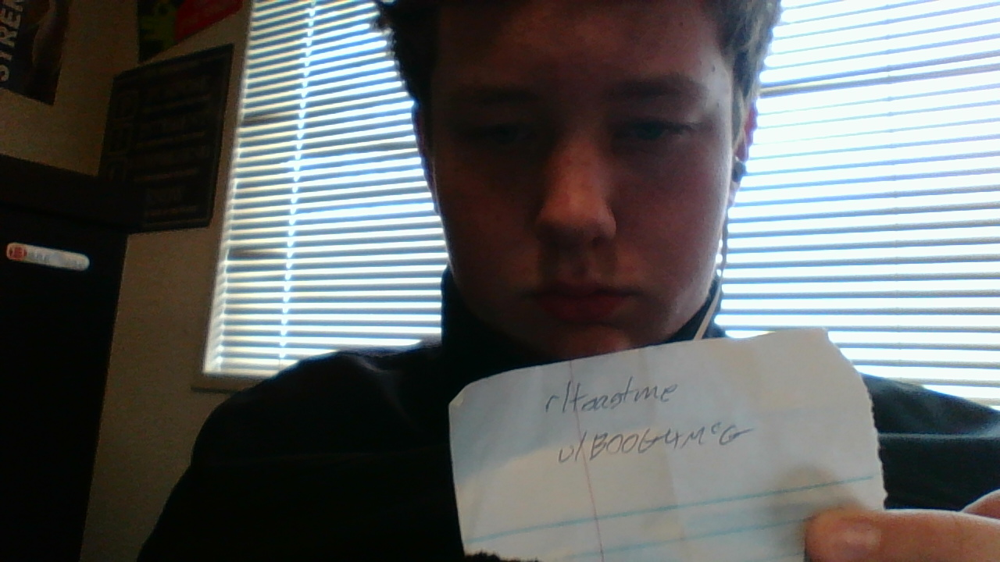

INPUT:
m mom has to have please give me any help you can

PREDICTED:
you have a lot of courage to be able to get through this you ’ ve got this you ’ re strong and you ’ re not done and have a lot of courage to be able to get through this you ’ ve got this you ’ re a beautiful woman who can ’ t be shape you _END

TARGET (real comment):
hey dude it ’ s going to be okay my dad lost his entire the of and he ’ s doing great now just over a year later he has a cool and he and goes to work and does exactly as he wants he even got _END
----------


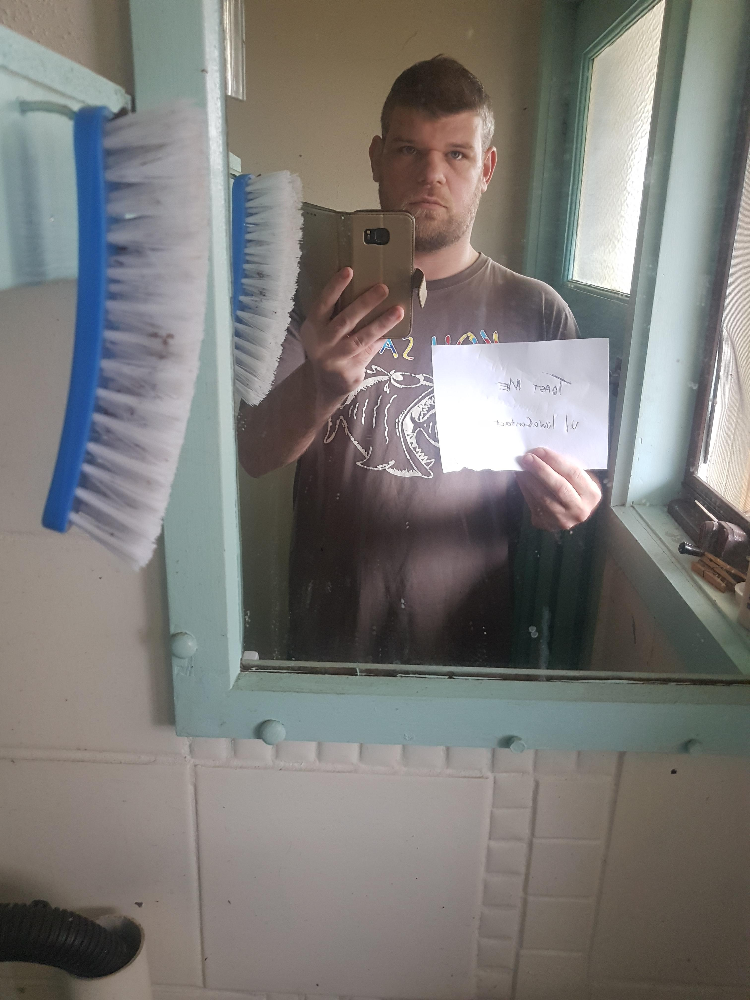

INPUT:
been struggling with depression anxiety and ptsd from childhood abuse

PREDICTED:
i m sure a lot of people who have to say you re a beautiful person who would be lucky to have a big heart and you have a great smile _END

TARGET (real comment):
you have very kind and eyes i d bet they light up when you smile i hope you find some to do so _END
----------


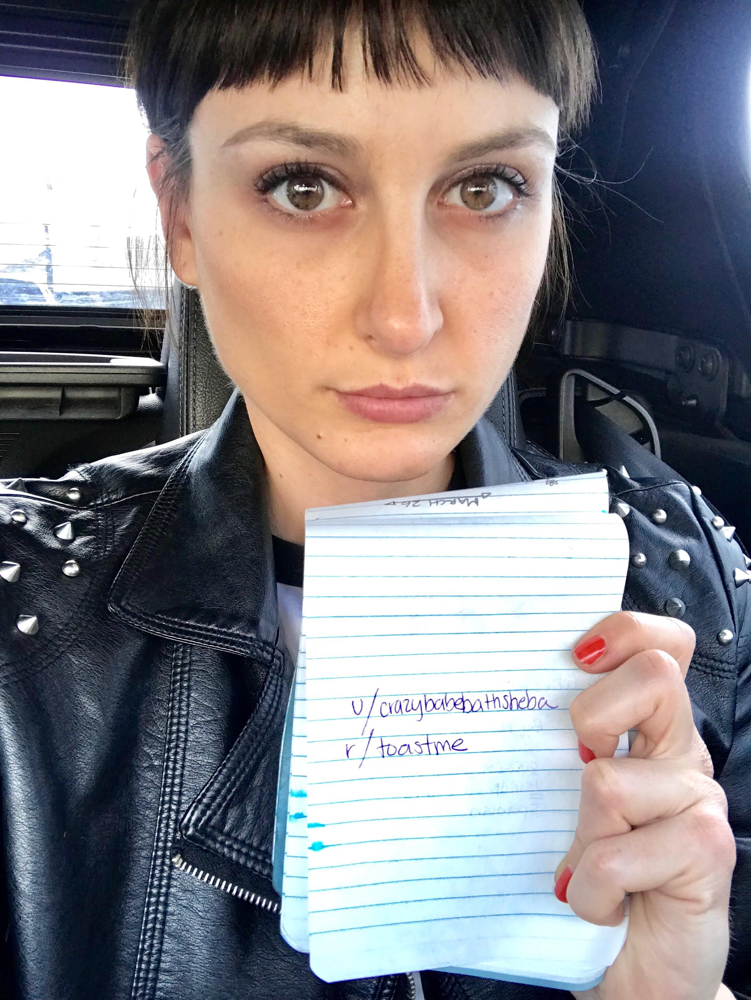

INPUT:
i have which makes nearly every human very stressful for me very lonely as result new meds helping also student who will be to pass another wpm test today with little hope

PREDICTED:
i m sorry you re going through a rough time but i m sure you re doing great _END

TARGET (real comment):
you can do it op never tell yourself the no matter the you did your best and keep on trying _END
----------


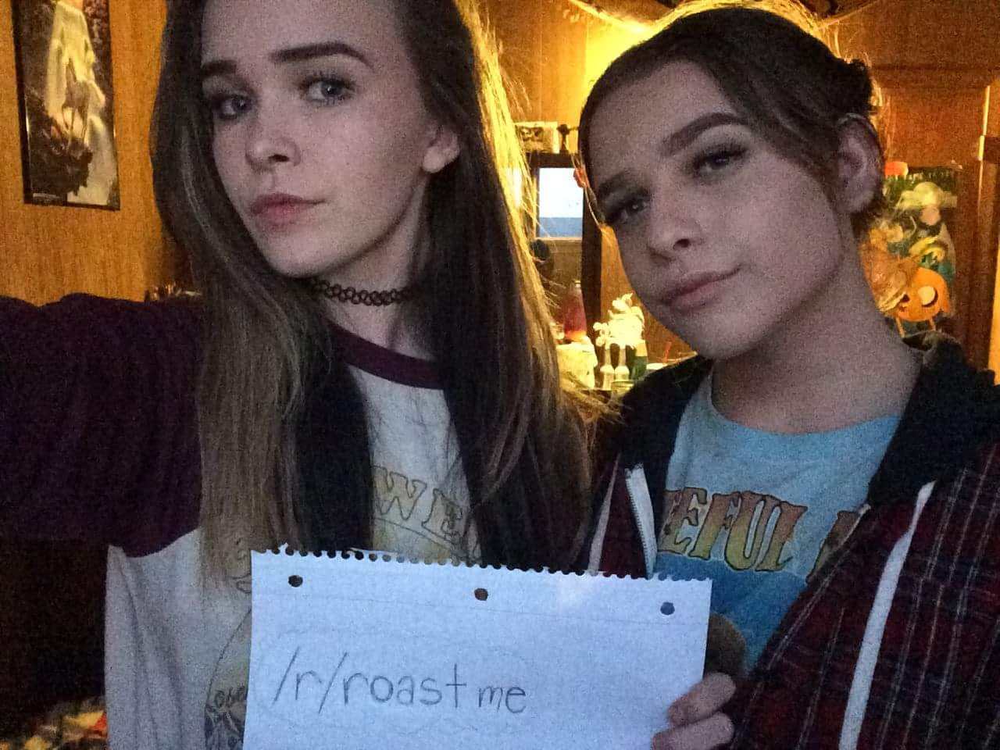

INPUT:
make us feel better after roast

PREDICTED:
i m so sorry you re going through a rough time but i m sure you re doing great _END

TARGET (real comment):
as long as i have a face both of you will have a place to _END
----------


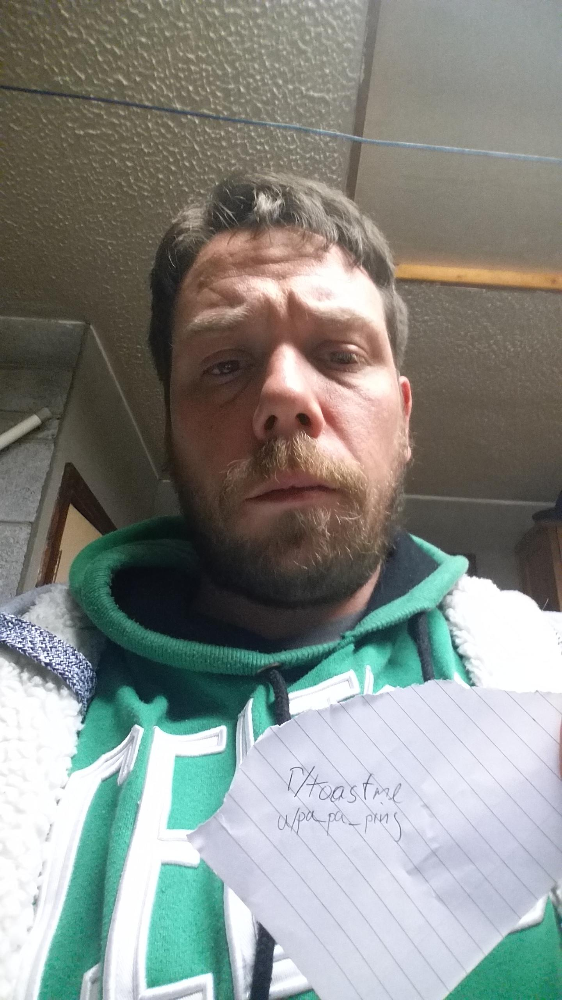

INPUT:
do your best please

PREDICTED:
you ’ re a beautiful person who can ’ t be scared of a lot of people who can handle you ’ re doing great _END

TARGET (real comment):
you look like a real man who can handle some kind of we call it no idea if that make sense in cheer up bro _END
----------


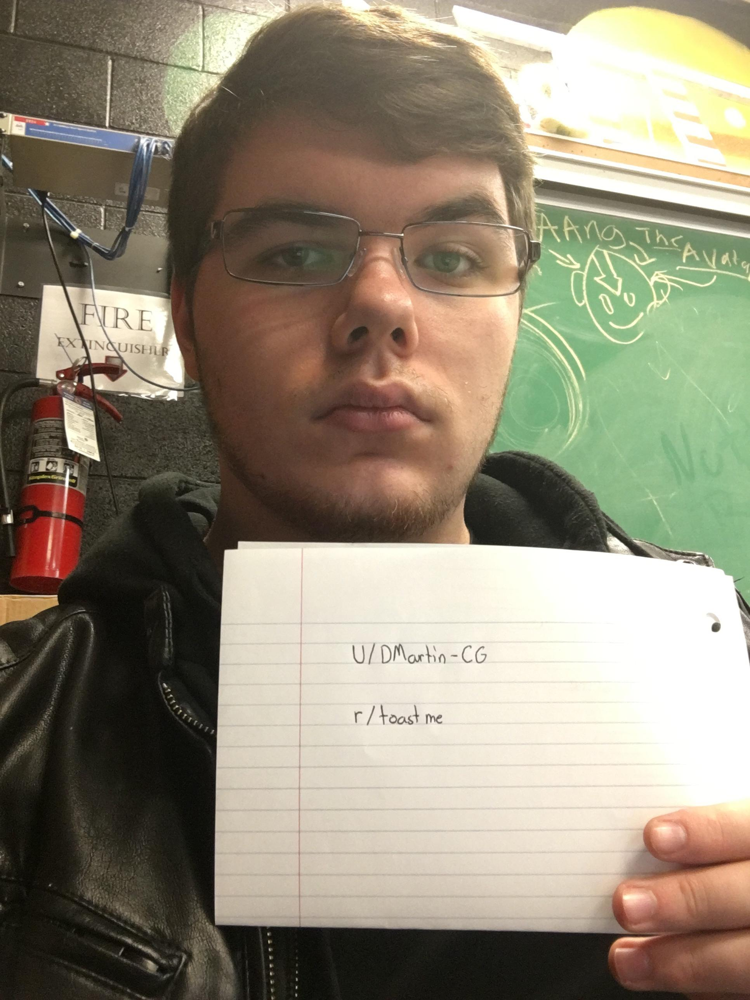

INPUT:
i think ugly

PREDICTED:
you ’ re a very handsome person and you ’ re doing great _END

TARGET (real comment):
very intelligent man gets something wrong i do nt you though anxiety even the face _END
----------


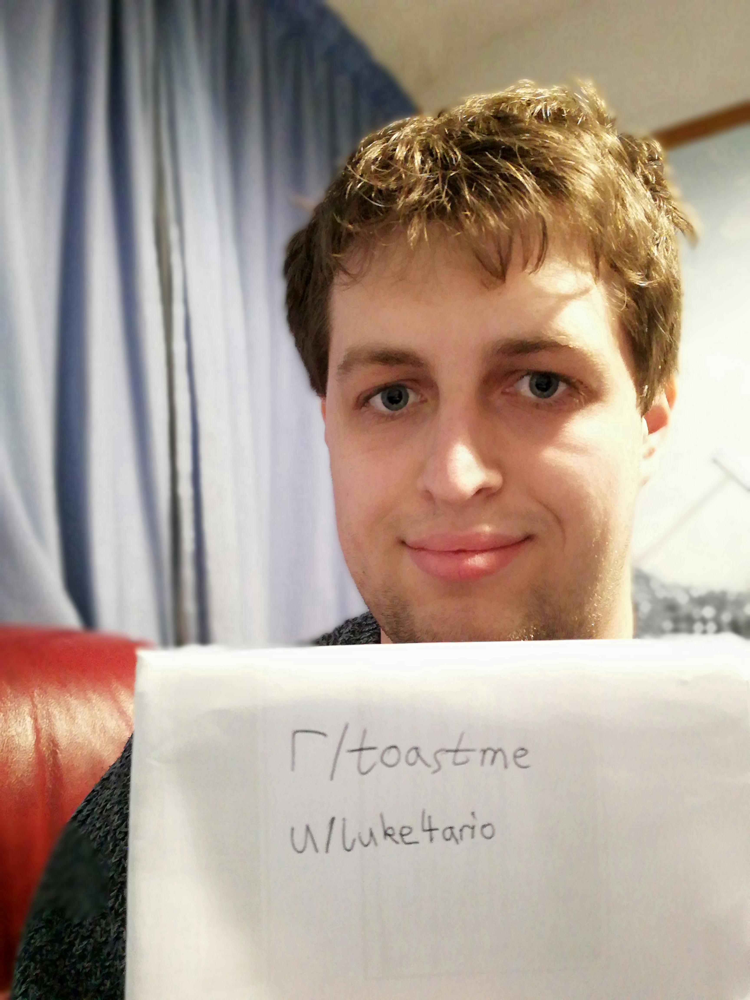

INPUT:
had really bad depression day and have myself that no girl will ever want to have anything more than friendship with me anyone giving me bit of boost

PREDICTED:
i ll get a time to be friends with you and i m sure you re going to be able to be happy and you are a strong person and you have a great smile _END

TARGET (real comment):
you look like a pretty guy who s fun to be around chin up dude there s someone out there for you and it ll be worth the wait i m sure _END
----------



C:\Users\morod\Anaconda3\lib\site-packages\nltk\translate\bleu_score.py:503: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
C:\Users\morod\Anaconda3\lib\site-packages\nltk\translate\bleu_score.py:503: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


0.0943738656987296

In [40]:
evaluate_model(reddit_test, encoder_input_data_te, decoder_input_data_te, start=100, end=120, print_examples=True)